In [51]:
import pybinding as pb
import numpy as np
import matplotlib.pyplot as plt
pb.pltutils.use_style()
import os
os.environ['MKL_VERBOSE'] = '0'
import pybinding as pb
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt, pi
from scipy.stats import wasserstein_distance
pb.pltutils.use_style()
from scipy.signal import find_peaks
from scipy.integrate import simps, trapezoid
import torch
import pybinding as pb
from math import sqrt, pi
import pointpats
from shapely.geometry import Polygon
import shapely
from scipy.ndimage import gaussian_filter1d


In [52]:
def numpy_to_tensor(np_array, requires_grad=False):
    return torch.tensor(np_array, requires_grad=requires_grad)

In [53]:
def Kagome_lattice(d=1, t=-1,v=0):
    a_cc = d # near-neighbor distance in the lattice
    a=a_cc*2
    lat = pb.Lattice(a1=[a*sqrt(3)/2, -a/2],
                     a2=[a*sqrt(3)/2, a/2])
    lat.add_sublattices(('A',[a*sqrt(3)/4,-a/4],v),('B',[a*sqrt(3)/4,a/4],v),('C', [0, 0],v))
    lat.add_hoppings(([0,0],'A','C',t),
                     ([1,0],'A','C',t),
                     ([0,0],'B','A',t),
                     ([-1,1],'B','A',t),
                     ([0,0],'C','B',t),
                     ([0,-1],'C','B',t),
                    )

    return lat



In [54]:
#Take the shape and hamiltonian parameters as input and return the model
def lattice_model(d=1,t=-1.0,v=0,plot_figure=False):
    lattice = Kagome_lattice(d, t, v)
    model = pb.Model(lattice, pb.translational_symmetry(a1=True,a2=True))
    if plot_figure:
        model.plot()
    return lattice, model

In [55]:
#Compute total density-of-state of the Hamiltonian by sampling the full BZ 
def DOS_Ganesh(lattice, model, solver, bins=1000,range=[-6,6],density=True, size=10000, sigma=12.0, plot_figure=False):

    np.set_printoptions(threshold=np.inf)
    # Coordinates of polygon edges forming the BZ
    coords = lattice.brillouin_zone()
    pgon = Polygon(coords)
    print('coordinates of the hexagonal BZ: ', pgon.convex_hull)
    #print(coords)
    # Generates points inside (and edges) of the polygon sampling them from a normal distribution
    kbzs = pointpats.random.normal(pgon, size=10000,center=[0,0])
    #print(*kbzs)
    #Check if sampled points are inside the plygon
    kpoly = Polygon(kbzs)
    print('Does k-points samples lie within the hexagoonal BZ? ', pgon.contains(kpoly)) #this needs to be 'True' for the code to work
    #Calculate energies on these sampled k-points in the BZ 
    #(each k-point has 3 values due to 3 eigenvectors for the 3-band model)
    eigens = []
    for i in kbzs:
        solver.set_wave_vector(i)
        eigens.append(solver.eigenvalues.flatten())
    eigens = np.array(eigens)
    #print(eigens[0:3])
    eigens = eigens.flatten('C')
    #print(eigens.shape)
    #np.array(eigens).flatten()
    #Compute the histogram density-of-state 
    count, bins = np.histogram(eigens,bins=bins,range=range,density=density)#plt.show()
    count = gaussian_filter1d(count, sigma=12.0)

    if plot_figure:
        plt.plot(bins[0:-1],count, label='Original')
        plt.plot(bins[0:-1],count, label='Smoothed')
        plt.legend()
        plt.show()

    return count, bins

In [56]:
# DOS MSE Function
def DOS_squared_error(DOS_target, DOS_current):
    return np.sum((DOS_target - DOS_current)**2)

# DOS wasserstein distance Function
def DOS_Wasserstein_distance(DOS_target, DOS_current):
    return wasserstein_distance(DOS_target, DOS_current)

# Bhatttacharya distance Function
def DOS_Bhattacharya_distance(DOS_target, DOS_current): 
    return -np.log(np.sum(np.sqrt(DOS_target*DOS_current)))

# KL-Divergence Function
def DOS_KLDivergence_distance(DOS_target, DOS_current): 
    return np.sum(DOS_target*np.log(DOS_current/DOS_target))

#Helinger distance Function
def DOS_Helinger_distance(DOS_target, DOS_current): 
    return 1-np.sum(np.sqrt(DOS_target*DOS_current))

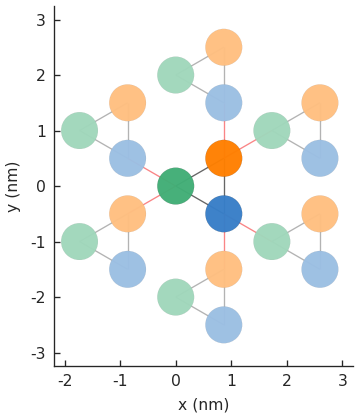

In [57]:
#plot target DOS
# Target Model
lattice_target, model_target = lattice_model(d=1,t=-1.0,v=0,plot_figure=True)
solver_target = pb.solver.lapack(model_target)


coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True


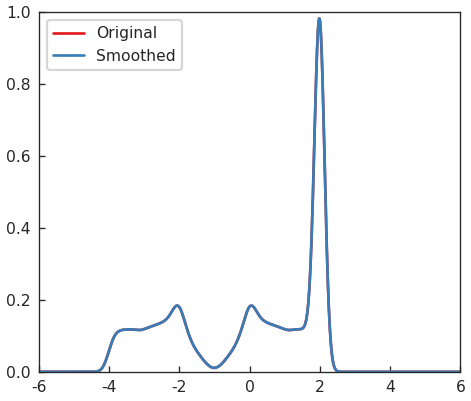

In [58]:
DOS_target, bins_target = DOS_Ganesh(lattice_target,model_target,solver_target, plot_figure=True)

In [59]:
# error = DOS_Helinger_distance(DOS_target, DOS_target)
# print(error)

In [60]:
def compute_train_obj(train_x, DOS_target):
    train_obj = []
    for input_x in train_x:
        lattice_current, model_current = lattice_model(d=1,t=input_x[0].item(),v=input_x[1].item())
        solver_current = pb.solver.lapack(model_current)
        # Calculate the error

        DOS_current, bins_current = DOS_Ganesh(lattice_current, model_current, solver_current)
        error = DOS_Helinger_distance(DOS_target, DOS_current)
        error = -error # MAXIMIZATION PROBLEM
        train_obj.append(error)
    # Stack the list of errors
    train_obj = torch.tensor(train_obj).reshape(-1,1)
    #print(train_obj.shape)
    #train_obj = torch.cat(train_obj).reshape(-1,1)
    return train_obj


In [61]:
tkwargs = {
    "dtype": torch.double,
    "device": torch.device("cuda" if torch.cuda.is_available() else "cpu"),
}
SMOKE_TEST = os.environ.get("SMOKE_TEST")

In [62]:
dimension = 2
lower_bound = torch.tensor([-1.4, -1], **tkwargs)
upper_bound = torch.tensor([1.4, 1], **tkwargs)
least_count = torch.tensor([0.1, 0.1], **tkwargs)

In [63]:
from botorch.models import SingleTaskGP
from botorch.models.model_list_gp_regression import ModelListGP
from botorch.models.transforms.outcome import Standardize
from gpytorch.mlls.sum_marginal_log_likelihood import SumMarginalLogLikelihood
from botorch.utils.transforms import unnormalize, normalize
from botorch.utils.sampling import draw_sobol_samples
from gpytorch.mlls import ExactMarginalLogLikelihood
from gpytorch.kernels import RBFKernel, ScaleKernel

def generate_initial_data(n=5):
    # generate training data
    train_x = draw_sobol_samples(bounds=torch.stack([lower_bound, upper_bound]), n=n, q=1, seed=0).squeeze(1)
    train_obj = compute_train_obj(train_x, DOS_target)
    print(f"Train X: {train_x}")
    print(f"Train Obj: {train_obj}")
    return train_x, train_obj

#generate_initial_data(5)


In [64]:
def initialize_model(train_x, train_obj):
    # define models for objective
    train_x = normalize(train_x, bounds=torch.stack([lower_bound, upper_bound]))
    model = SingleTaskGP(train_X=train_x, train_Y=train_obj, covar_module=RBFKernel(ard_num_dims=dimension))
    mll = ExactMarginalLogLikelihood(model.likelihood, model)
    return mll, model
  


In [65]:
from botorch.optim.optimize import optimize_acqf, optimize_acqf_list
from botorch.acquisition.objective import GenericMCObjective
from botorch.utils.multi_objective.scalarization import get_chebyshev_scalarization
from botorch.utils.multi_objective.box_decompositions.non_dominated import (
    FastNondominatedPartitioning,)
from botorch.acquisition.multi_objective.monte_carlo import (
    qExpectedHypervolumeImprovement, qNoisyExpectedHypervolumeImprovement,)
from botorch.utils.sampling import sample_simplex
from botorch.acquisition import qExpectedImprovement, qUpperConfidenceBound, qProbabilityOfImprovement, qNoisyExpectedImprovement
from botorch.acquisition import ExpectedImprovement

BATCH_SIZE = 5
NUM_RESTARTS = 10 if not SMOKE_TEST else 2
RAW_SAMPLES = 512 if not SMOKE_TEST else 4

standard_bounds = torch.zeros(2, dimension, **tkwargs)
standard_bounds[1] = 1.0

def optimize_acqf_and_get_observation(model, train_x, train_obj, sampler, iteration):

    qEI = qExpectedImprovement(
        model=model,
        #best_f=train_obj.max()-0.1*train_obj.max(),
        best_f= (train_obj.max() - 0.3*train_obj.max()) if iteration > 20 else train_obj.max(),
        #best_f = train_obj.max()+0.1*train_obj.max(),
        sampler=sampler,
    )
    qNEI = qNoisyExpectedImprovement(
        model = model,
        X_baseline=train_x,
        sampler=sampler,
    )
    qUCB = qUpperConfidenceBound(
        model=model,
        beta= 0.1 if iteration > 20 else 0.5,
        sampler=sampler,
    )

    qPI = qProbabilityOfImprovement(
        model=model,
        best_f=train_obj.max(),
        sampler=sampler,
    )
    # EI_analytic = ExpectedImprovement(
    #     model=model,
    #     best_f=train_obj.max(),
    # )

    candidates, _ = optimize_acqf(
        acq_function=qEI,
        bounds=standard_bounds,
        q=BATCH_SIZE,
        num_restarts=NUM_RESTARTS,
        raw_samples=RAW_SAMPLES,
        options={},
    )

    new_x = unnormalize(candidates.detach(), bounds=torch.stack([lower_bound, upper_bound]))
    new_obj = compute_train_obj(new_x, DOS_target)
    return new_x, new_obj


In [66]:
def plot_2D_train_obj(train_x, new_x, train_obj, new_obj, iteration):
    best_obj = train_obj.max()
    best_location = train_x[train_obj.argmax()]

    # Combine objective value to get common color scale range
    combined_obj =  torch.cat([train_obj, new_obj])
    # vmin, vmax = combined_obj.min(), combined_obj.max()

    vmin, vmax = 0, 85

    # # Seperate points within and outside the specified color scale range
    # train_mask = (train_obj >= vmin) & (train_obj <= vmax)
    # new_mask = (new_obj >= vmin) & (new_obj <= vmax)

    # train_x_within = train_x[train_mask.squeeze()]  
    # train_obj_within = train_obj[train_mask]
    # train_x_outside = train_x[~train_mask.squeeze()]
    # train_obj_outside = train_obj[~train_mask]
    
    # new_x_within = new_x[new_mask.squeeze()]
    # new_obj_within = new_obj[new_mask]
    # new_x_outside = new_x[~new_mask.squeeze()]
    # new_obj_outside = new_obj[~new_mask]
    # Plot the points
    plt.figure()
    scatter = plt.scatter(train_x[:,0].cpu(), train_x[:,1].cpu(), c=train_obj.cpu(), s=15, edgecolor='k', vmin=vmin, vmax=vmax, cmap='jet', label='Train Points')    
    new_scatter = plt.scatter(new_x[:,0].cpu(), new_x[:,1].cpu(), c=new_obj.cpu(), s=50, edgecolor='r', vmin=vmin, vmax=vmax, cmap='jet', label='New Points')
    cbar = plt.colorbar(scatter)
    cbar.set_label('Objective Value')
    plt.scatter(best_location[0].cpu(), best_location[1].cpu(), c=best_obj, marker='*', s=100, vmin=vmin, vmax=vmax, cmap='jet', label='Best Solution')
    plt.scatter(-1, 0.0, c=82.33, marker='*', s=100, vmin=vmin, vmax=vmax, cmap='jet', label='Target Solution')
    plt.title(f'Iteration {iteration}')
    plt.xlabel('t')
    plt.ylabel('v')
    plt.legend(loc='lower right')
    #plt.savefig(f'./Plots_3/BO_iteration_{iteration}.png')
    plt.show()

coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordin

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)


Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-

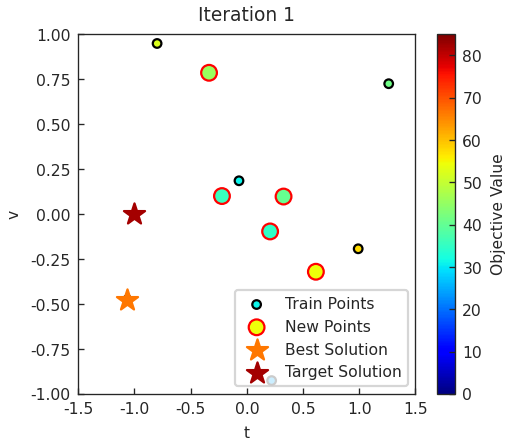

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 1

Best DOS Peak Error: 66.60429602449193 at location tensor([-1.0627, -0.4771], dtype=torch.float64) for itertion number 1

Time: 26.47
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1

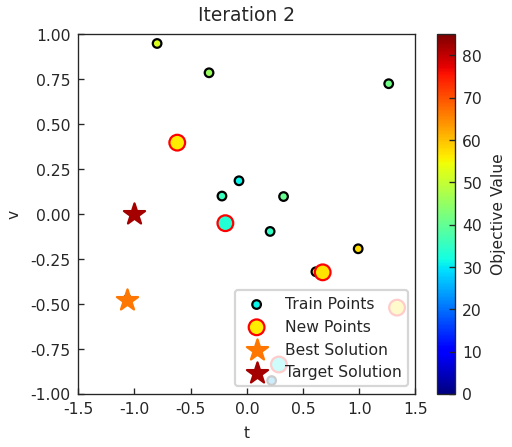

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 2

Best DOS Peak Error: 66.60429602449193 at location tensor([-1.0627, -0.4771], dtype=torch.float64) for itertion number 1

Time: 26.52
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1

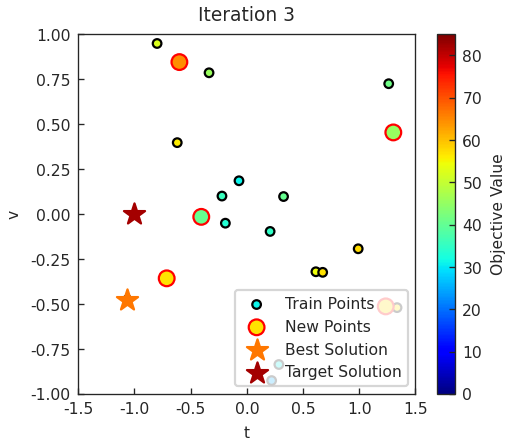

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 3

Best DOS Peak Error: 66.60429602449193 at location tensor([-1.0627, -0.4771], dtype=torch.float64) for itertion number 1

Time: 26.86
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1

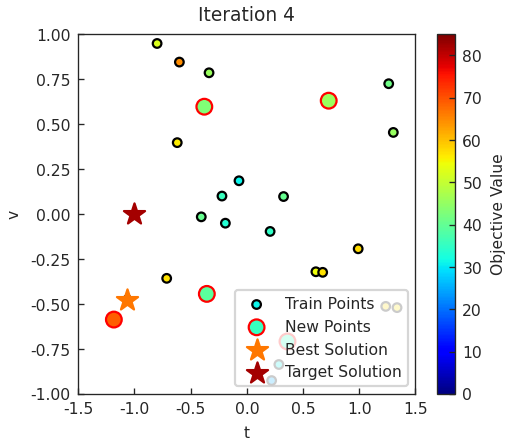

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 4

Best DOS Peak Error: 68.98692879109774 at location tensor([-1.1827, -0.5866], dtype=torch.float64) for itertion number 4

Time: 26.79
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1

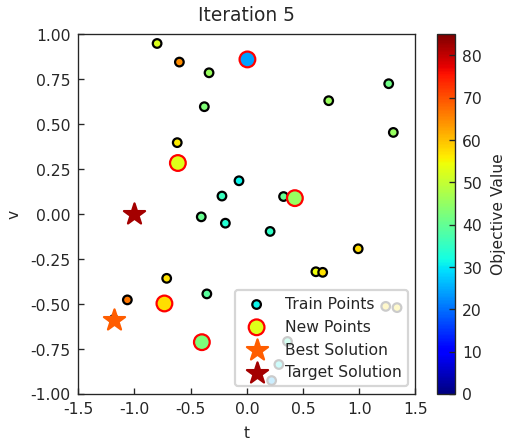

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 5

Best DOS Peak Error: 68.98692879109774 at location tensor([-1.1827, -0.5866], dtype=torch.float64) for itertion number 4

Time: 26.94
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1

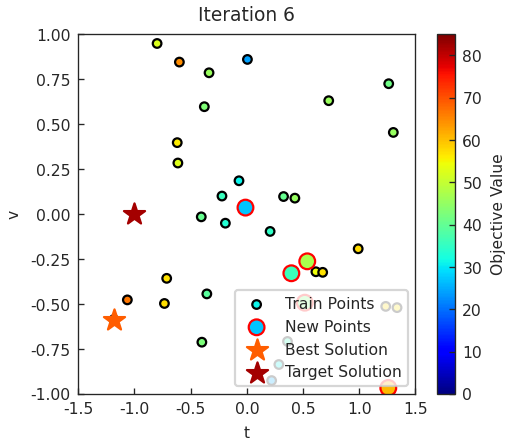

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 6

Best DOS Peak Error: 68.98692879109774 at location tensor([-1.1827, -0.5866], dtype=torch.float64) for itertion number 4

Time: 26.81
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1

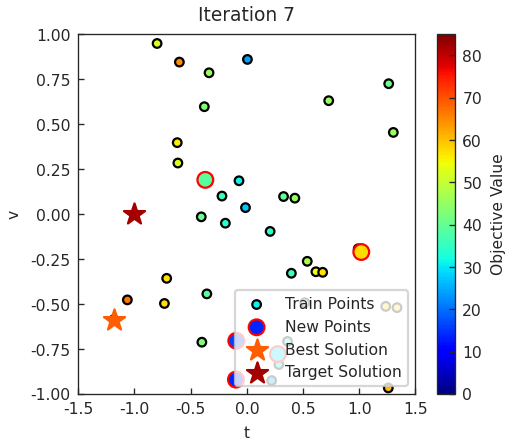

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 7

Best DOS Peak Error: 68.98692879109774 at location tensor([-1.1827, -0.5866], dtype=torch.float64) for itertion number 4

Time: 26.77
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1

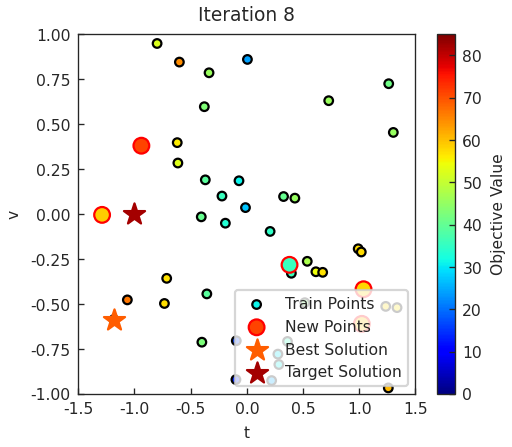

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 8

Best DOS Peak Error: 71.1895486972436 at location tensor([-0.9380,  0.3800], dtype=torch.float64) for itertion number 8

Time: 26.89
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.

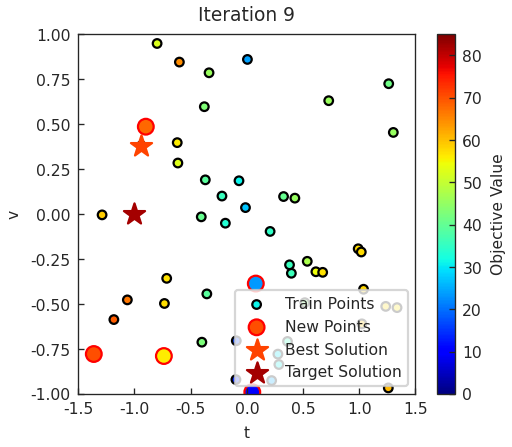

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 9

Best DOS Peak Error: 71.1895486972436 at location tensor([-0.9380,  0.3800], dtype=torch.float64) for itertion number 8

Time: 26.97
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.

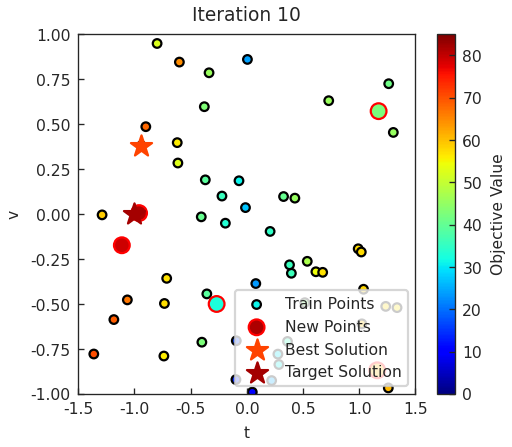

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 10

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.13
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

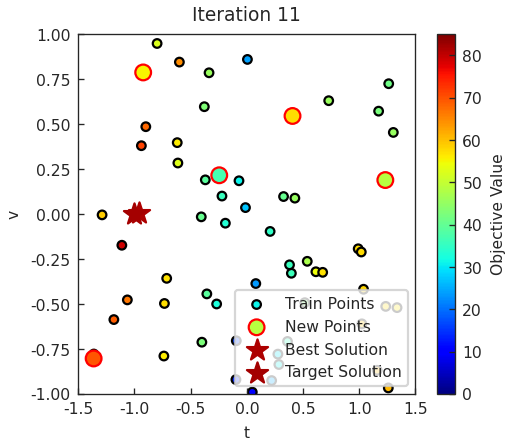

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 11

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 26.90
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

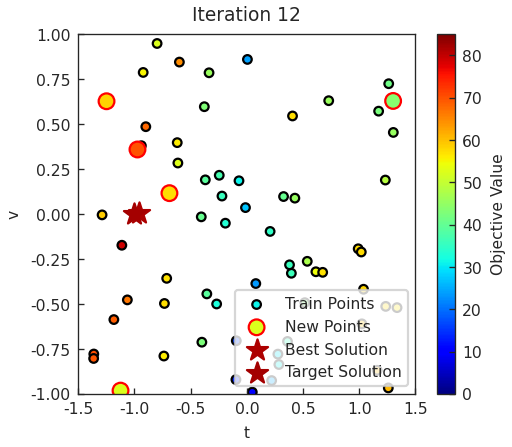

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 12

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 26.97
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

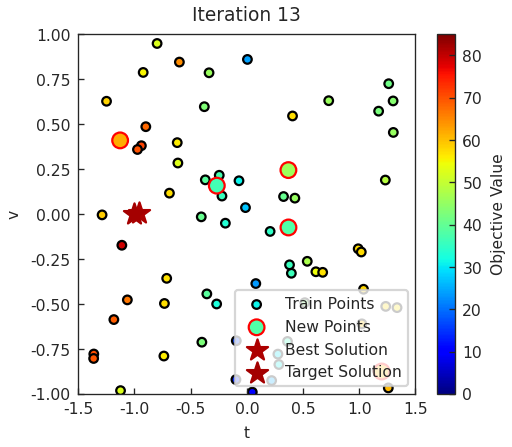

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 13

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 26.90
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

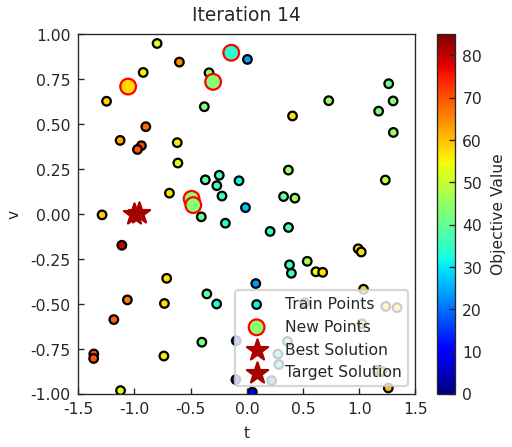

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 14

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.18
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

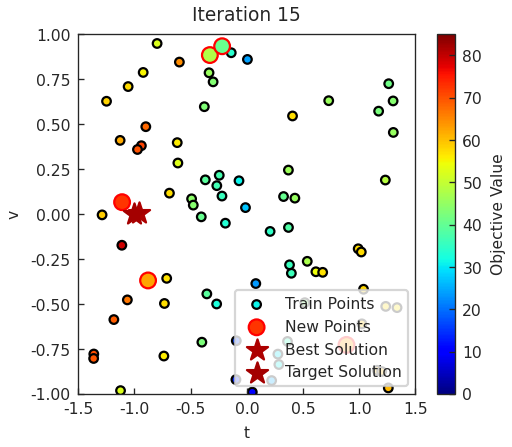

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 15

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.89
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

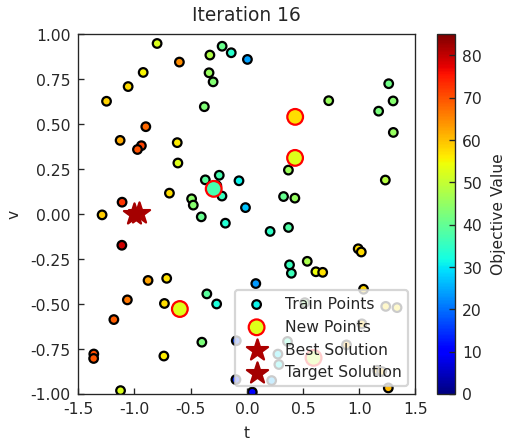

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 16

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.70
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

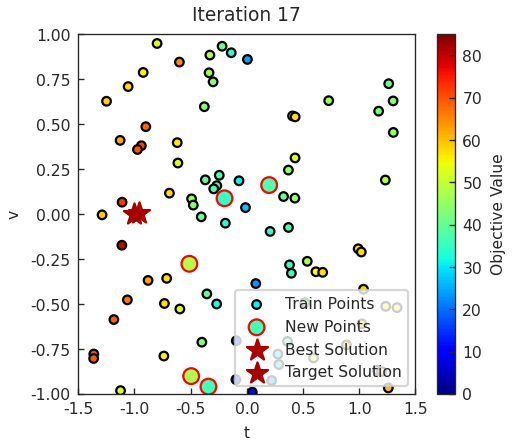

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 17

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.43
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

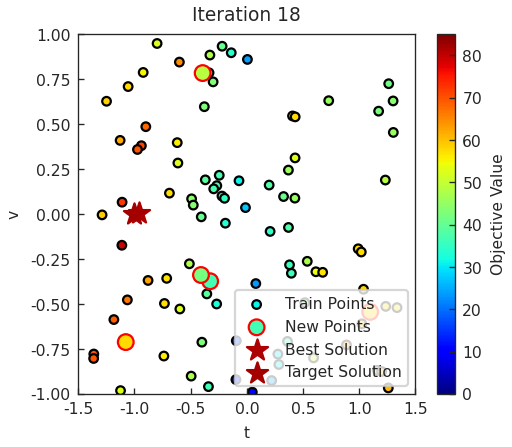

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 18

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.46
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

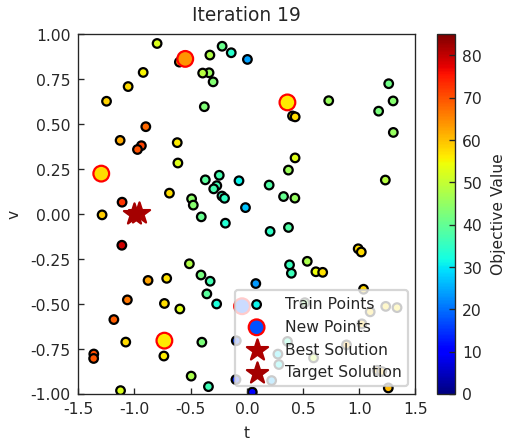

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 19

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.08
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

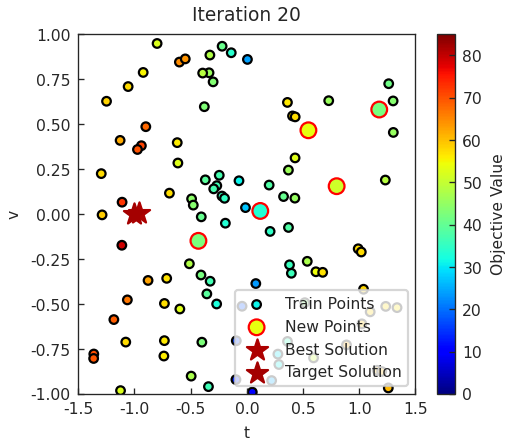

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 20

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.26
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

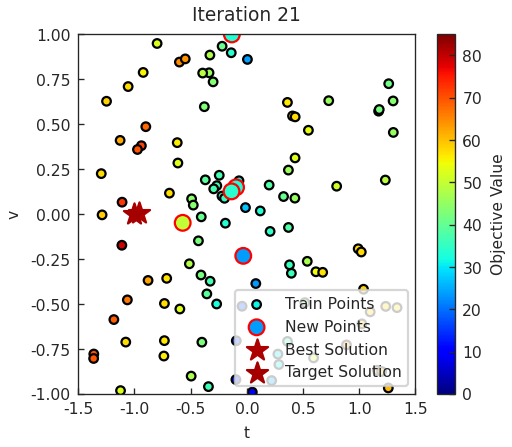

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 21

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.09
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

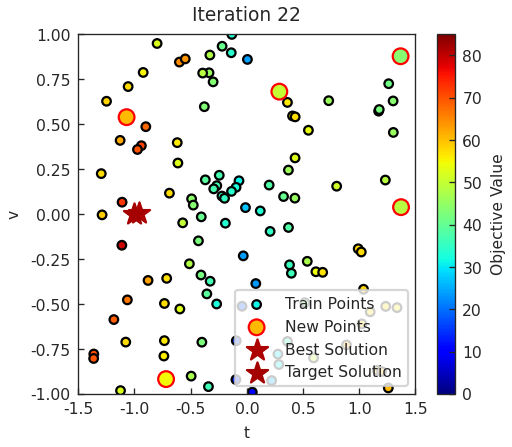

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 22

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 26.91
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

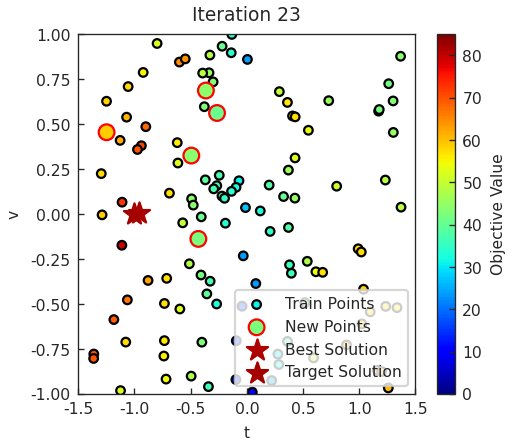

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 23

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 26.96
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

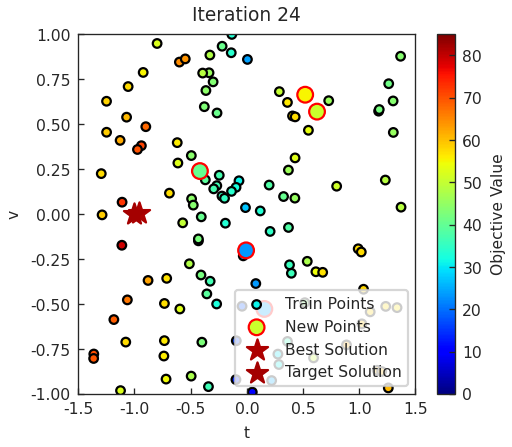

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 24

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.05
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035

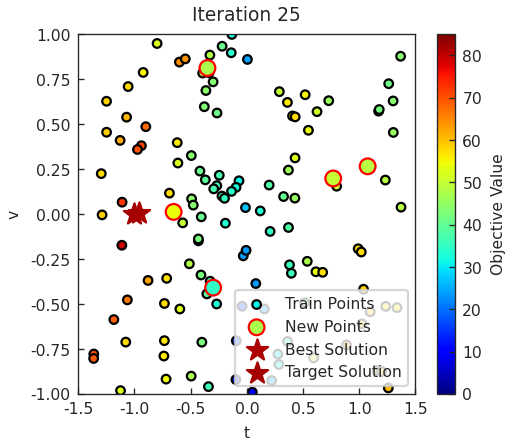

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 25

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.31
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

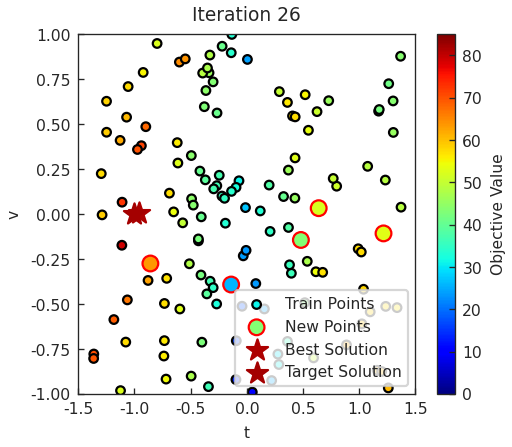

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 26

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.07
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

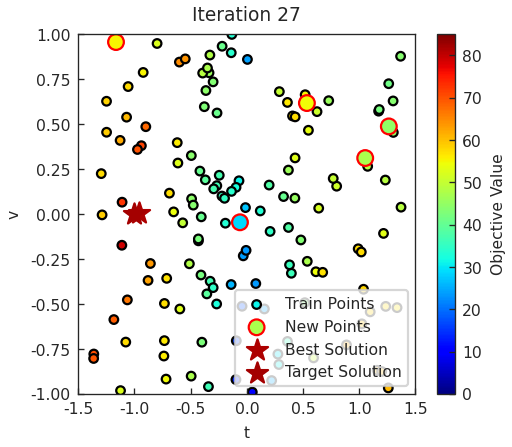

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 27

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.56
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

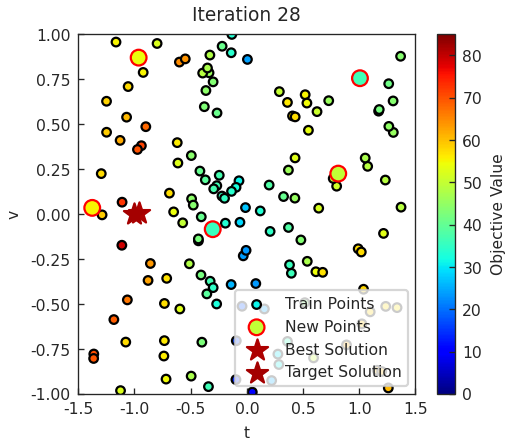

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 28

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.09
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

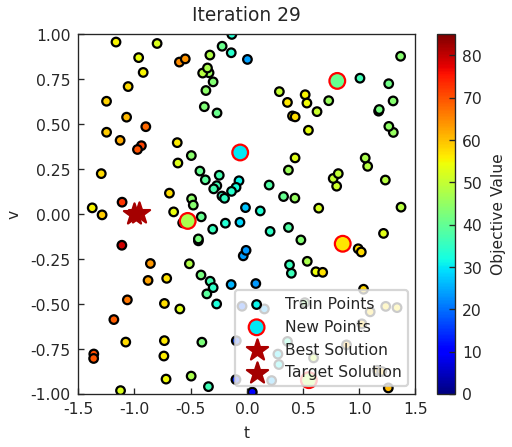

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 29

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.82
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

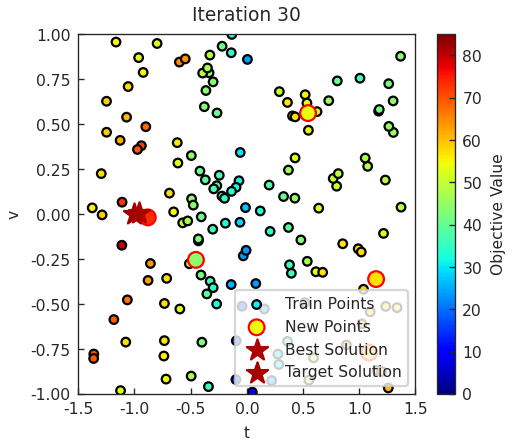

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 30

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.85
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only pr

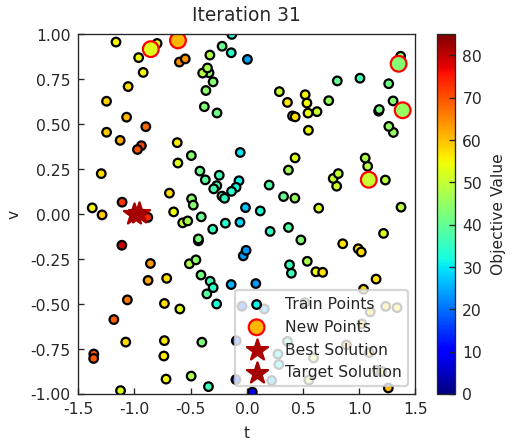

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 31

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.65
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

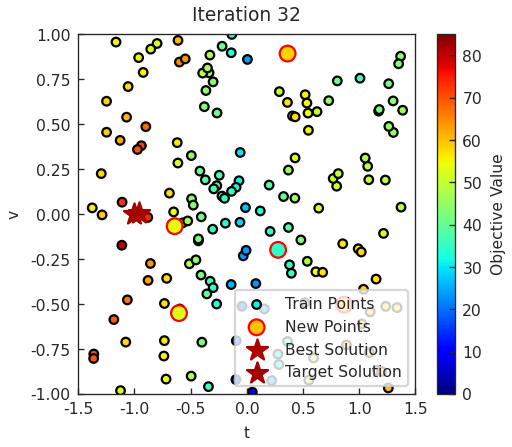

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 32

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.58
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only pr

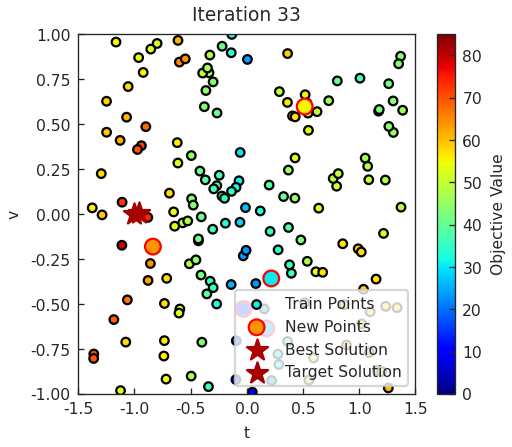

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 33

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.51
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only pr

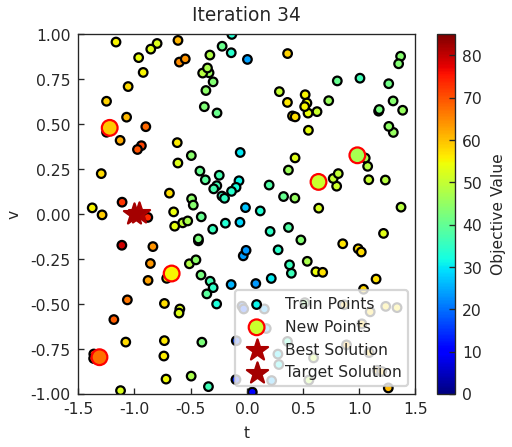

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 34

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.43
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only p

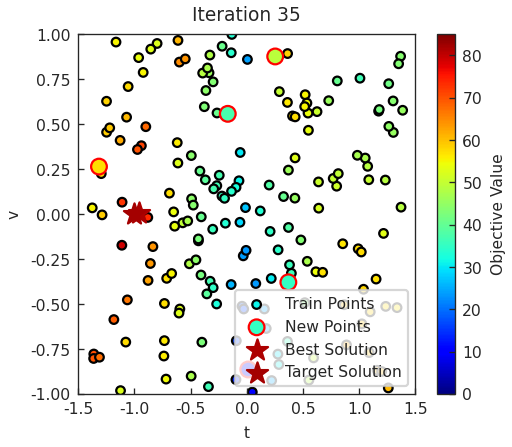

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 35

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.36
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only p

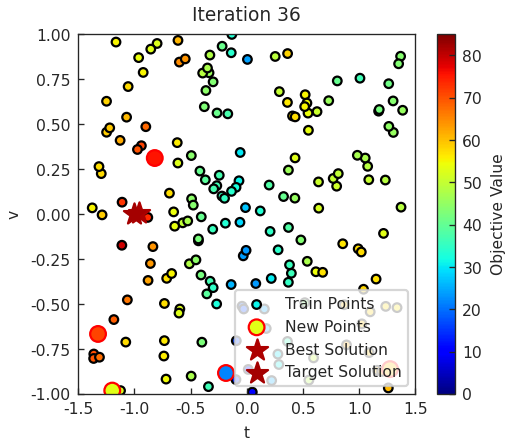

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 36

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.88
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only p

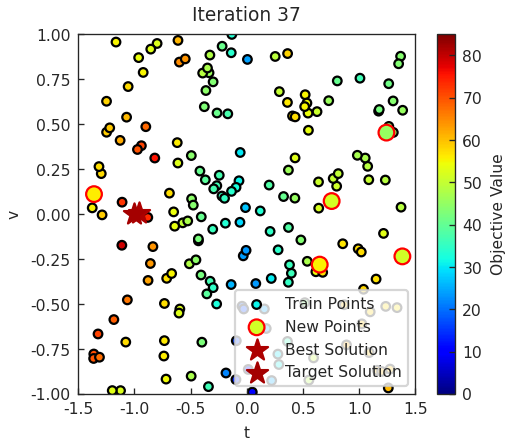

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 37

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.61
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

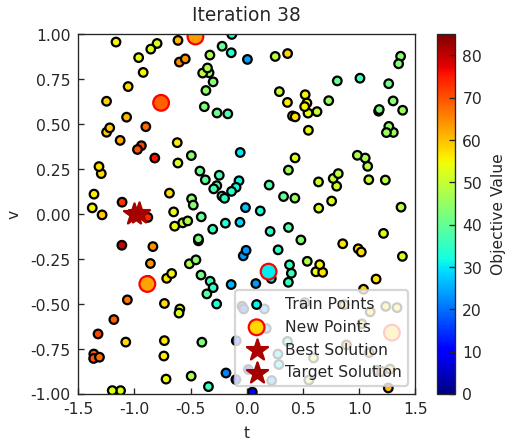

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 38

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.47
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

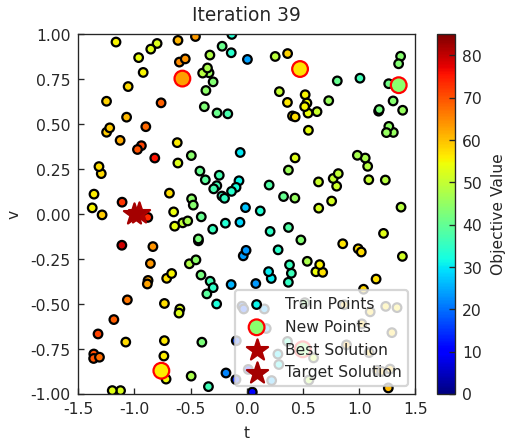

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 39

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.23
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only p

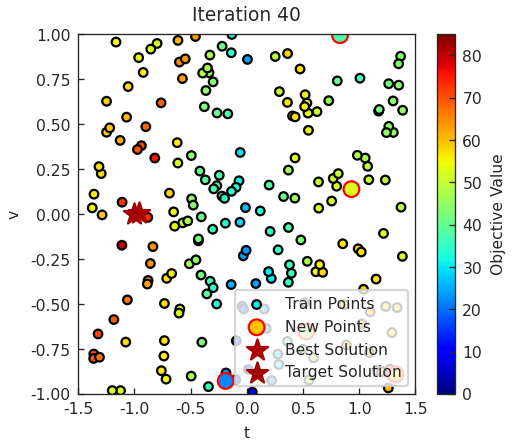

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 40

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.66
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only pr

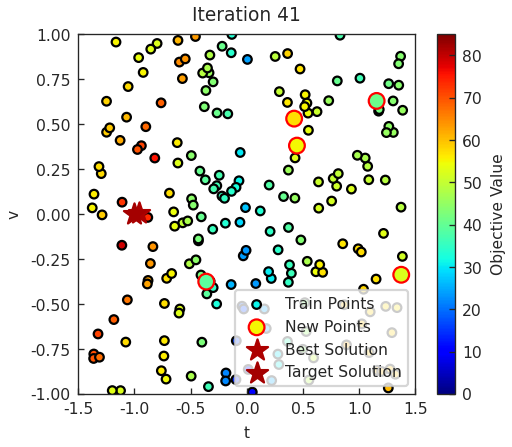

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 41

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.64
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

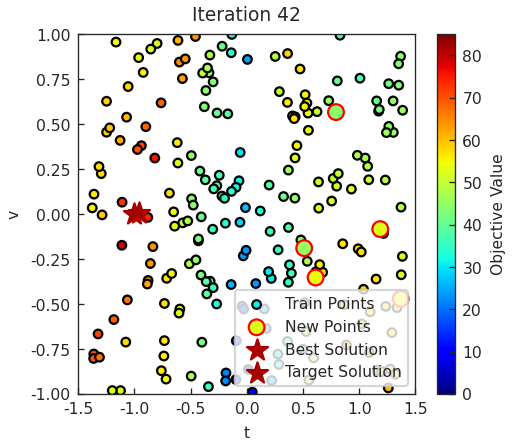

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 42

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.72
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

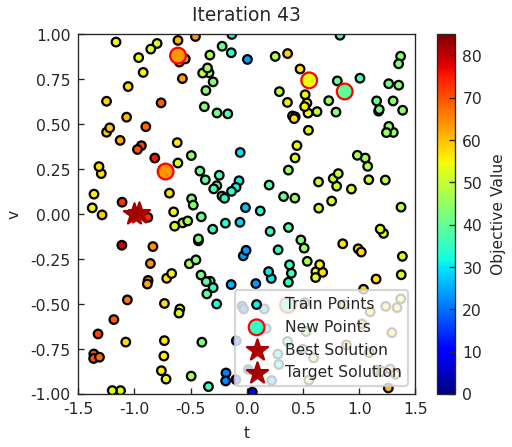

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 43

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.71
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only p

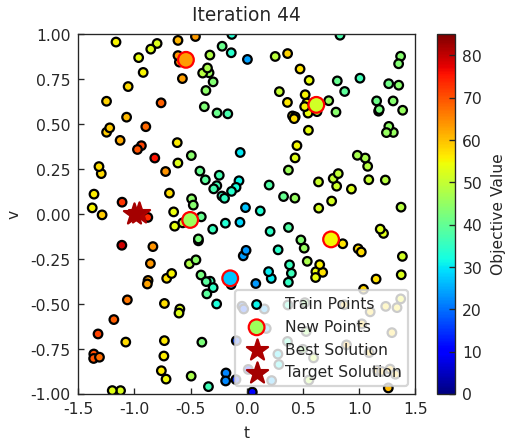

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 44

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.20
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

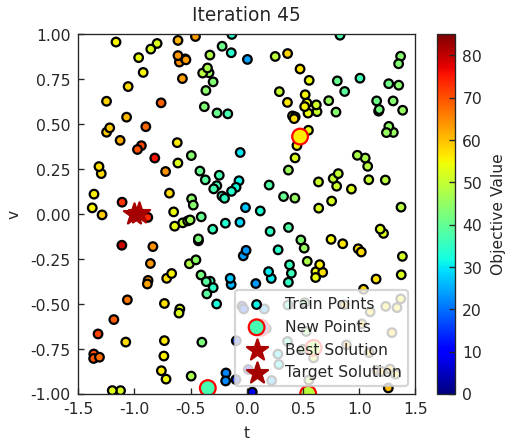

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 45

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 30.28
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

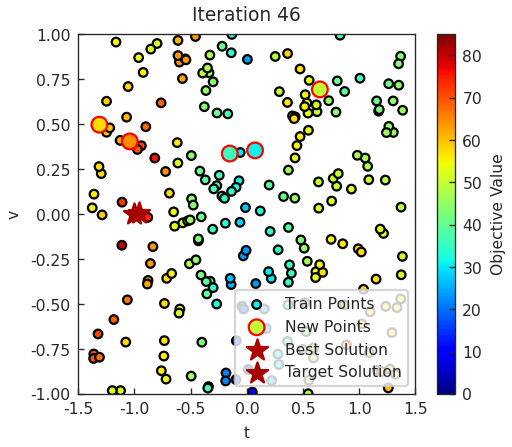

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 46

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 29.12
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

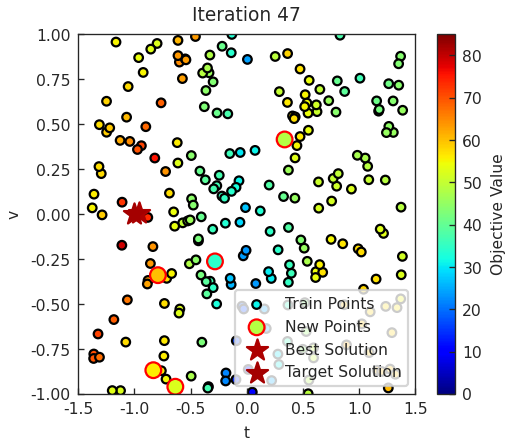

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 47

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.58
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only p

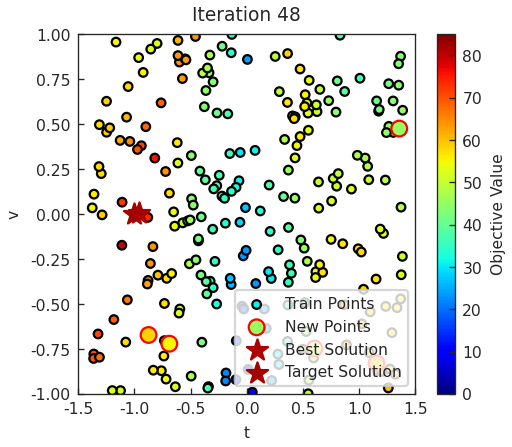

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 48

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.96
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

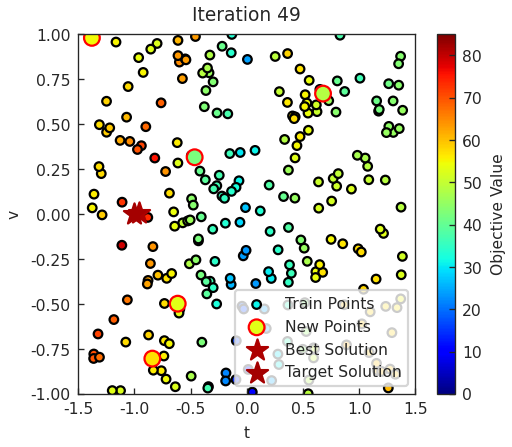

/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)



Iteration 49

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 28.73
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only 

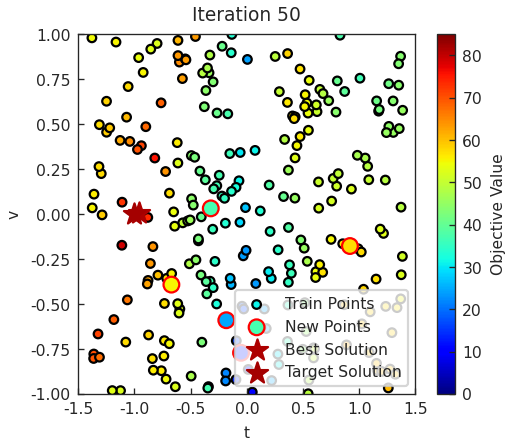


Iteration 50

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10

Time: 27.52

Best DOS Peak Error: 81.37743211007253 at location tensor([-0.9586,  0.0054], dtype=torch.float64) for itertion number 10


/Users/ankushmishra/miniconda3/envs/hamiltonian/lib/python3.8/site-packages/botorch/models/utils/assorted.py:201: InputDataWarning: Input data is not standardized. Please consider scaling the input to zero mean and unit variance.
  warnings.warn(msg, InputDataWarning)


In [67]:
import time
import warnings

from botorch import fit_gpytorch_mll
from botorch.exceptions import BadInitialCandidatesWarning
from botorch.sampling.normal import SobolQMCNormalSampler
from botorch.utils.multi_objective.box_decompositions.dominated import (
    DominatedPartitioning,
)
from botorch.utils.multi_objective.pareto import is_non_dominated

warnings.filterwarnings('ignore', category=BadInitialCandidatesWarning)
warnings.filterwarnings('ignore', category=RuntimeWarning)

N_BATCH = 50 if not SMOKE_TEST else 5
MC_SAMPLES = 1024 if not SMOKE_TEST else 16

verbose = True

# Generate initial data

train_x_qei, train_obj_qei = generate_initial_data(n=2*(dimension+1))
print(train_obj_qei.shape)
mll_qei, model_qei = initialize_model(train_x_qei, train_obj_qei)

best_obj_value = float('-inf')
best_iteration = -1




# run N_BATCH rounds of BayesOpt after the initial random batch

for iteration in range(1, N_BATCH+1):
    t0 = time.monotonic()

    # fit the model
    fit_gpytorch_mll(mll_qei)

    # define sampler
    qei_sampler = SobolQMCNormalSampler(sample_shape=torch.Size([MC_SAMPLES]))

    # optimize acquisition function and get new observation
    new_x_qei, new_obj_qei = optimize_acqf_and_get_observation(model_qei, train_x_qei, train_obj_qei, qei_sampler, iteration)
    print(f"\nNext Points: {new_x_qei}")
    print(f"\nNext Objectives: {new_obj_qei}")
    
    #Plot the points
    plot_2D_train_obj(train_x_qei, new_x_qei, train_obj_qei, new_obj_qei, iteration)
   
    #update the training points
    train_x_qei = torch.cat([train_x_qei, new_x_qei])
    train_obj_qei = torch.cat([train_obj_qei, new_obj_qei])

    mll_qei, model_qei = initialize_model(train_x_qei, train_obj_qei)
    t1 = time.monotonic()

    #Update best objective value and iteration
    current_best_value = train_obj_qei.max().item()
    if current_best_value > best_obj_value:
        best_obj_value = current_best_value
        best_iteration = iteration

    if verbose:
        print("\nIteration", iteration)
        print(f"\nBest DOS Peak Error: {train_obj_qei.max()} at location {train_x_qei[train_obj_qei.argmax()]} for itertion number {best_iteration}")
        print(f"\nTime: {t1-t0:.2f}")
    else:
        print(".", end="")

print(f"\nBest DOS Peak Error: {best_obj_value} at location {train_x_qei[train_obj_qei.argmax()]} for itertion number {best_iteration}")
first_point_gd = train_x_qei[train_obj_qei.argmax()]

In [68]:
def BFGS_objective(x):
    x = torch.tensor(x)
    train_obj = -compute_train_obj(x.unsqueeze(0), DOS_target)  # To make it as a minimization problem
    return train_obj.item()

In [ ]:
from scipy.optimize import minimize
#first_point_gd = torch.tensor([-0.9586, 0.0054])
#first_point_gd = torch.tensor([0.0660, 0.0972])
initial_point = first_point_gd.numpy()

# RUN  optimization
result = minimize(BFGS_objective, initial_point, method='Powell', options={'disp': True, 'maxiter': 1000})

# Extract the optimized parameters and the objective function value at the solution
optimized_point = torch.tensor(result.x).float()
objective_value = -result.fun  # Negate back to get the original objective value since we minimized the negative

print(f"Optimized Point: {optimized_point}")
print(f"Objective Value at Optimized Point: {objective_value}")


coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordin

coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True
coordinates of the hexagonal BZ:  POLYGON ((0 -2.0943951413617126, -1.8137993812561035 -1.0471975996508607, -1.8137993812561035 1.0471975996508607, 0 2.0943951413617126, 1.8137993812561035 1.0471975996508607, 1.8137993812561035 -1.0471975996508607, 0 -2.0943951413617126))
Does k-points samples lie within the hexagoonal BZ?  True


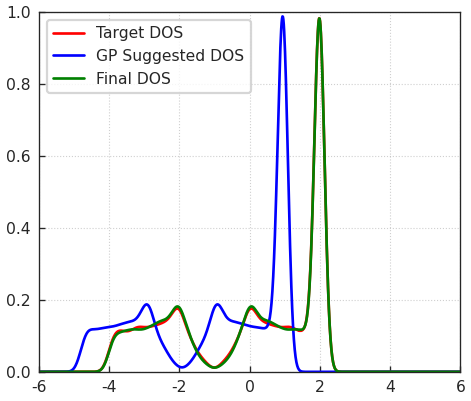

In [72]:
DOS_target, bins_target = DOS_Ganesh(lattice_target,model_target,solver_target)

lattice_GP_final, model_GP_final = lattice_model(d=1,t=first_point_gd[0].item(),v=first_point_gd[0].item())
solver_GP_final = pb.solver.lapack(model_GP_final)
DOS_GP_final, bins_GP_final = DOS_Ganesh(lattice_GP_final,model_GP_final,solver_GP_final)

lattice_ZO_final, model_ZO_final = lattice_model(d=1,t=optimized_point[0].item(),v=optimized_point[1].item())
solver_ZO_final = pb.solver.lapack(model_ZO_final)
DOS_ZO_final, bins_ZO_final = DOS_Ganesh(lattice_ZO_final, model_ZO_final,solver_ZO_final)




plt.figure()
plt.plot(bins_target[0:-1], DOS_target, label='Target DOS', color='red')
plt.plot(bins_GP_final[0:-1], DOS_GP_final, label='GP Suggested DOS', color='blue')
plt.plot(bins_ZO_final[0:-1], DOS_ZO_final, label='Final DOS', color='green')
plt.legend()
#plt.ylim(0, 1600)
plt.grid(True)
plt.box(True)
plt.show()

